## 고양잇과 동물 분류

### 1️⃣ 데이터셋 불러오기

In [1]:
root = './datasets/bigcat/original/'

In [2]:
from glob import glob
import os

directories = glob(os.path.join(root, '*'))
directory_names = []
for directory in directories:
    directory_names.append(directory[directory.rindex('\\') + 1:])

print(directory_names)

['AFRICAN LEOPARD', 'CARACAL', 'CHEETAH', 'CLOUDED LEOPARD', 'JAGUAR', 'LIONS', 'OCELOT', 'PUMA', 'SNOW LEOPARD', 'TIGER']


In [3]:
for name in directory_names:
    for i, file_name in enumerate(os.listdir(os.path.join(root, name))):
        old_file = os.path.join(root + name + '/', file_name)
        new_file = os.path.join(root + name + '/', name + str(i + 1) + '.png')

        os.rename(old_file, new_file)

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

BATCH_SIZE = 16

image_generator = ImageDataGenerator(rescale = 1./255)

generator = image_generator.flow_from_directory(root, target_size=(244,244), batch_size=BATCH_SIZE, class_mode='categorical')
print(generator.class_indices)

Found 2339 images belonging to 10 classes.
{'AFRICAN LEOPARD': 0, 'CARACAL': 1, 'CHEETAH': 2, 'CLOUDED LEOPARD': 3, 'JAGUAR': 4, 'LIONS': 5, 'OCELOT': 6, 'PUMA': 7, 'SNOW LEOPARD': 8, 'TIGER': 9}


In [5]:
target_name = {v: k for k, v in generator.class_indices.items()}
target_name

{0: 'AFRICAN LEOPARD',
 1: 'CARACAL',
 2: 'CHEETAH',
 3: 'CLOUDED LEOPARD',
 4: 'JAGUAR',
 5: 'LIONS',
 6: 'OCELOT',
 7: 'PUMA',
 8: 'SNOW LEOPARD',
 9: 'TIGER'}

In [6]:
target_names = []
for target in generator.classes:
    target_names.append(target_name[target])

In [8]:
import pandas as pd
cat_df = pd.DataFrame({'file_paths': generator.filepaths, 'target_names': target_names, 'targets': generator.classes})
cat_df.file_paths = cat_df.file_paths.apply(lambda file_path: file_path.replace('\\', '/'))
cat_df

,file_paths,target_names,targets
0,./datasets/bigcat/original/AFRICAN LEOPARD/AFR...,AFRICAN LEOPARD,0
1,./datasets/bigcat/original/AFRICAN LEOPARD/AFR...,AFRICAN LEOPARD,0
2,./datasets/bigcat/original/AFRICAN LEOPARD/AFR...,AFRICAN LEOPARD,0
3,./datasets/bigcat/original/AFRICAN LEOPARD/AFR...,AFRICAN LEOPARD,0
4,./datasets/bigcat/original/AFRICAN LEOPARD/AFR...,AFRICAN LEOPARD,0
...,...,...,...
2334,./datasets/bigcat/original/TIGER/TIGER95.png,TIGER,9
2335,./datasets/bigcat/original/TIGER/TIGER96.png,TIGER,9
2336,./datasets/bigcat/original/TIGER/TIGER97.png,TIGER,9
2337,./datasets/bigcat/original/TIGER/TIGER98.png,TIGER,9


In [9]:
from sklearn.model_selection import train_test_split

train_images,test_images, train_targets, test_targets = \
train_test_split(cat_df.file_paths, 
                 cat_df.targets, 
                 stratify=cat_df.targets, 
                 test_size=0.2, random_state=124)

print(train_targets.value_counts())
print(test_targets.value_counts())

targets
9    190
4    190
0    189
7    189
1    189
2    188
6    186
8    185
3    183
5    182
Name: count, dtype: int64
targets
4    48
0    47
1    47
9    47
7    47
2    47
6    47
8    46
3    46
5    46
Name: count, dtype: int64


In [10]:
from sklearn.model_selection import train_test_split

train_images, validation_images, train_targets, validation_targets = \
train_test_split(train_images, 
                 train_targets, 
                 stratify=train_targets, 
                 test_size=0.2, random_state=124)

print(train_targets.value_counts())
print(validation_targets.value_counts())

targets
4    152
9    152
1    151
0    151
7    151
2    150
6    149
8    148
5    146
3    146
Name: count, dtype: int64
targets
2    38
4    38
1    38
0    38
9    38
7    38
8    37
3    37
6    37
5    36
Name: count, dtype: int64


In [11]:
train_df = cat_df.iloc[train_images.index].reset_index(drop=True)
validation_df = cat_df.iloc[validation_images.index].reset_index(drop=True)
test_df = cat_df.iloc[test_images.index].reset_index(drop=True)
print(train_df.shape)
print(validation_df.shape)
print(test_df.shape)

(1496, 3)
(375, 3)
(468, 3)


### 2️⃣ 샘플 데이터 확인

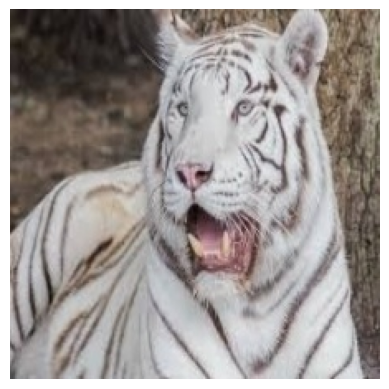

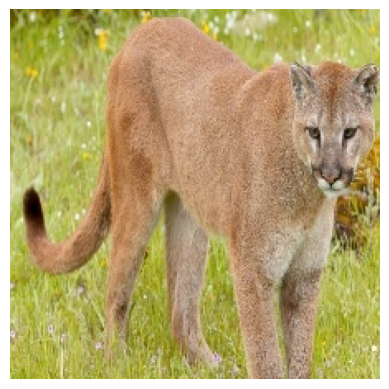

In [12]:
import cv2
import matplotlib.pyplot as plt

image = cv2.cvtColor(cv2.imread(train_df.file_paths.iloc[500]), cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

image = cv2.cvtColor(cv2.imread(train_df.file_paths.iloc[100]), cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

### ⭐ 이미지, 배치 사이즈 지정

In [13]:
IMAGE_SIZE = 244
BATCH_SIZE = 16

### 3️⃣ 사전 훈련 모델 선정을 위한 predict

In [14]:
import numpy as np
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
import cv2

# 데이터 세트 생성 class 정의
class Dataset(Sequence):
    # 클래스의 초기화
    # 경로, 타겟, 배치 크기, albumentations 객체, 전처리 하마, 셔플 여부를 인자로 받음
    def __init__(self, file_paths, targets, batch_size=BATCH_SIZE, aug=None, preprocess=None, shuffle=False):
        self.file_paths = file_paths
        self.targets = targets
        self.batch_size = batch_size
        self.aug = aug
        self.preprocess = preprocess
        self.shuffle = shuffle

        # shuffle True 시 진행:
        if self.shuffle:
            # epoch 끝날 때마다 호출
            self.on_epoch_end()

    # 전체 데이터 세트 크기 반환
    def __len__(self):
        # 하나의 배치 사이즈에 필요한 데이터 개수 리턴
        return int(np.ceil(len(self.targets) / self.batch_size))

    # 주어진 인덱스에 해당하는 배치 반환
    def __getitem__(self, index):
        # 파일 경로와 타겟 데이터를 배치 크기만큼 자르고, 이미지를 불러와 처리한 후 배치로 반환
        file_paths_batch = self.file_paths[index * self.batch_size: (index + 1) * self.batch_size]
        targets_batch = self.targets[index * self.batch_size: (index + 1) * self.batch_size]

        # 데이터 배치 저장
        results_batch = np.zeros((file_paths_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))

        # 데이터 수만큼 반복
        for i in range(file_paths_batch.shape[0]):
            # RGB로 색상 형식을 변환하여 이미지 가져오기
            image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            # 이미지 크기 조정
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

            # albumentations이 있다면:
            if self.aug is not None:
                # Augmentor 객체로 이미지 변환
                image = self.aug(image=image)['image']

            # 전처리 함수가 있다면:
            if self.preprocess is not None:
                # 이미지 전처리 진행
                image = self.preprocess(image)

            # 결과 배치에 이미지를 저장
            results_batch[i] = image

        # 결과 배치와 타겟 배치를 반환
        return results_batch, targets_batch
        
    def on_epoch_end(self):
        # shuffle 옵션이 켜져있다면, 데이터를 섞기
        if self.shuffle:
            # epoch 끝날 때마다 데이터 섞기
            self.file_paths, self.targets = shuffle(self.file_paths, self.targets)

In [15]:
def create_dataset(paths, targets, BATCH_SIZE, shuffle=True):   
    return Dataset(paths,
                   targets,
                   batch_size=BATCH_SIZE,
                   shuffle=True)

In [16]:
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt

from tensorflow.keras.applications.vgg16 import VGG16, decode_predictions as vgg16_decode_predictions
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, decode_predictions as resnet50v2_decode_predictions
from tensorflow.keras.applications.xception import Xception, decode_predictions as xception_decode_predictions
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, decode_predictions as mobilenetv2_decode_predictions

def predict_and_display(images, titles, model_name):
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=len(images))

    # VGG16 모델 선택
    if model_name == 'vgg16':
        model = VGG16()
        decode_predictions = vgg16_decode_predictions
        target_size = (224, 224)
    # ResNet50V2 모델 선택
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2()
        decode_predictions = resnet50v2_decode_predictions
        target_size = (224, 224)
    # Xception 모델 선택
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception()
        decode_predictions = xception_decode_predictions
        target_size = (299, 299)
    # MobileNetV2 모델 선택
    elif model_name == 'mobilenet':
        model = MobileNetV2()
        decode_predictions = mobilenetv2_decode_predictions
        target_size = (224, 224)

    for i, image in enumerate(images):
        # 모델 입력 크기에 맞게 이미지 크기 조정
        resized_image = cv2.resize(image, target_size)
        # 이미지 배열로 변환
        image_array = img_to_array(resized_image)
        # 차원 확장 (배열의 첫 번째 차원 확장)
        image_array = np.expand_dims(image_array, axis=0)
        # 이미지 예측
        prediction = model.predict(image_array)
        # 이미지 분류 모델의 예측 결과를 해석
        target = decode_predictions(prediction)
        # 높은 확률로 예측 된 클래스 이름과 확률
        predicted_class = target[0][0][1]
        predicted_probability = np.round(target[0][0][2] * 100, 2)
        
        # 이미지와 예측 결과 표시
        axs[i].imshow(image.astype('int'))
        axs[i].axis('off')
        axs[i].set_title(f"{predicted_class}\n{predicted_probability}%")

        print(target)

In [17]:
import matplotlib.pyplot as plt

def show_images(files_batch, ncols=4, title=None):    
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=ncols)
    
    for i in range(ncols):
        # files_batch는 float이므로 int로 변경
        axs[i].imshow(np.array(files_batch[i], dtype='int32'))
        axs[i].axis('off')
        axs[i].set_title(title[i]) 

In [18]:
import albumentations as A

# 각 클래스에서 하나씩 이미지를 샘플링하여 균등한 배치 구성
sampled_df = test_df.groupby('targets', group_keys=False).apply(lambda x: x.sample(1))

# 데이터 경로 및 타겟 담기 (get_dummies를 통해 원-핫 인코딩 진행)
sampled_file_paths = sampled_df['file_paths'].values
sampled_targets = pd.get_dummies(sampled_df['targets']).values # CategoricalCrossEntropy


In [19]:
dataset = create_dataset(sampled_file_paths, sampled_targets, BATCH_SIZE, shuffle=True)

In [20]:
files_batch, targets_batch = next(iter(dataset))
# 레이블 인코딩시, target 차원을 2차원으로 맞춰줘야 한다.
print(files_batch.shape, targets_batch.shape)

(10, 244, 244, 3) (10, 10)


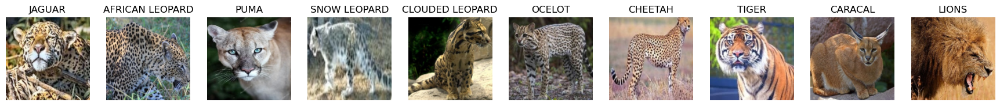

In [21]:
# 이미지 제목 생성
titles = [target_name[np.argmax(target)] for target in targets_batch]

# 정답 출력
show_images(files_batch, ncols=10, title=titles)

vgg16
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step
[[('n02128925', 'jaguar', 0.87103194), ('n02128385', 'leopard', 0.08214673), ('n02128757', 'snow_leopard', 0.046472553), ('n02130308', 'cheetah', 9.9650424e-05), ('n02129604', 'tiger', 5.8719444e-05)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
[[('n02128385', 'leopard', 0.9784323), ('n02128925', 'jaguar', 0.01982194), ('n02130308', 'cheetah', 0.001714202), ('n02128757', 'snow_leopard', 2.687019e-05), ('n02127052', 'lynx', 1.2512263e-06)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
[[('n02125311', 'cougar', 0.99975973), ('n02128925', 'jaguar', 0.0001477639), ('n02127052', 'lynx', 7.087464e-05), ('n02128757', 'snow_leopard', 9.8487535e-06), ('n02129165', 'lion', 7.0148635e-06)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
[[('n02018795', 'bustard', 0.12637937), ('n02415577', 'bighorn', 0.065287225), ('n01518878', 'ostrich', 0.06171339), ('n02422106', 'hartebeest', 0.061020296), ('n02423022', 'gazelle', 0.04046061)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


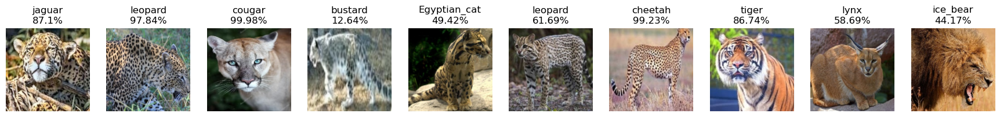

In [22]:
# 예측 모델 출력
print('vgg16')
predict_and_display(files_batch, titles, 'vgg16')

xception
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
[[('n03594945', 'jeep', 0.723837), ('n03763968', 'military_uniform', 0.11932274), ('n04461696', 'tow_truck', 0.07584585), ('n02971356', 'carton', 0.04571036), ('n03942813', 'ping-pong_ball', 0.022059608)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
[[('n02666196', 'abacus', 0.99959606), ('n02112350', 'keeshond', 0.00030775223), ('n03814906', 'necklace', 5.0470244e-05), ('n03763968', 'military_uniform', 4.0332445e-05), ('n02971356', 'carton', 3.1212642e-06)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
[[('n03775546', 'mixing_bowl', 1.0), ('n04116512', 'rubber_eraser', 4.2105872e-17), ('n02112350', 'keeshond', 4.119726e-23), ('n03942813', 'ping-pong_ball', 3.469709e-25), ('n04127249', 'safety_pin', 1.2564771e-26)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
[[('n04149813', 'scoreboard', 0.7957953), ('n03775546', 'mixing_bowl', 0.20420256), ('n03908714', 'pencil_sharpener', 2.1381832e-06), ('n02834397', 'bib', 1.1242092e-08), ('n03942813', 'ping-pong_ball'

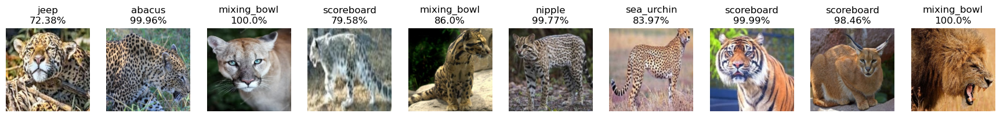

In [23]:
# 예측 모델 출력
print('xception')
predict_and_display(files_batch, titles, 'xception')

resnet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
[[('n07613480', 'trifle', 1.0), ('n15075141', 'toilet_tissue', 0.0), ('n02317335', 'starfish', 0.0), ('n02391049', 'zebra', 0.0), ('n02389026', 'sorrel', 0.0)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
[[('n07613480', 'trifle', 1.0), ('n15075141', 'toilet_tissue', 0.0), ('n02317335', 'starfish', 0.0), ('n02391049', 'zebra', 0.0), ('n02389026', 'sorrel', 0.0)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
[[('n02089973', 'English_foxhound', 0.94756025), ('n07613480', 'trifle', 0.052439723), ('n01855032', 'red-breasted_merganser', 1.5384624e-18), ('n02356798', 'fox_squirrel', 6.323286e-19), ('n02123597', 'Siamese_cat', 2.7656237e-26)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
[[('n02089973', 'English_foxhound', 1.0), ('n07613480', 'trifle', 7.6936643e-16), ('n02105056', 'groenendael', 1.8000781e-37), ('n01855032', 'red-breasted_merganser', 1.0934363e-37), ('n02356798', 'fox_squirrel', 0.0)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
[[('n02089973', 'English

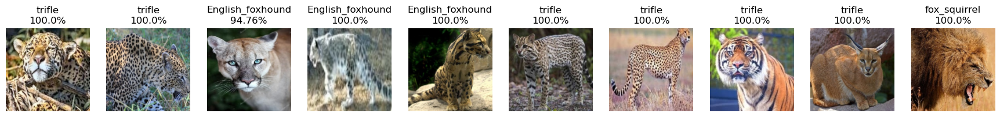

In [24]:
# 예측 모델 출력
print('resnet50')
predict_and_display(files_batch, titles, 'resnet50')

mobilenet
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
[[('n04209239', 'shower_curtain', 0.7282328), ('n03938244', 'pillow', 0.12683713), ('n02834397', 'bib', 0.021830102), ('n03291819', 'envelope', 0.011591415), ('n04548362', 'wallet', 0.01145548)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
[[('n03938244', 'pillow', 0.78432435), ('n03291819', 'envelope', 0.02668571), ('n03485794', 'handkerchief', 0.024419352), ('n02834397', 'bib', 0.015480669), ('n04033995', 'quilt', 0.011649555)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
[[('n04209239', 'shower_curtain', 0.9518262), ('n03938244', 'pillow', 0.02911069), ('n03291819', 'envelope', 0.0031231847), ('n02834397', 'bib', 0.00148739), ('n03485794', 'handkerchief', 0.0010980167)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
[[('n04209239', 'shower_curtain', 0.7400641), ('n04589890', 'window_screen', 0.031011714), ('n04550184', 'wardrobe', 0.012368323), ('n03347037', 'fire_screen', 0.008325388), ('n04418357', 'theater_curtain', 0.0071066166)]]
1/1 ━━━━━━━━━━━━━━━━━━

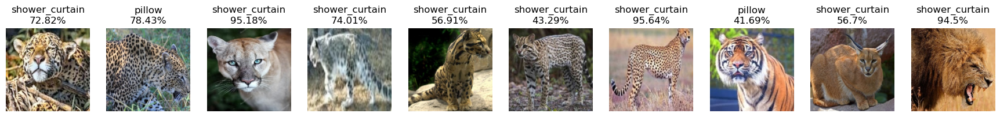

In [25]:
# 예측 모델 출력
print('mobilenet')
predict_and_display(files_batch, titles, 'mobilenet')

### ⭐ VGG16의 유사성이 가장 높아 VGG16을 모델로 채택

### 4️⃣ 성능확인을 위한 전체 fit

In [26]:
from tensorflow.keras.applications.resnet50 import preprocess_input

train_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
validation_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

train_flow = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='file_paths',
    y_col='target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = "categorical",
    shuffle=True
)

validation_flow = validation_generator.flow_from_dataframe(
    dataframe=validation_df,
    x_col='file_paths',
    y_col='target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = "categorical"
)

test_flow = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='file_paths',
    y_col='target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = "categorical"
)
print(train_flow.class_indices)
print(validation_flow.class_indices)
print(test_flow.class_indices)

Found 1496 validated image filenames belonging to 10 classes.
Found 375 validated image filenames belonging to 10 classes.
Found 468 validated image filenames belonging to 10 classes.
{'AFRICAN LEOPARD': 0, 'CARACAL': 1, 'CHEETAH': 2, 'CLOUDED LEOPARD': 3, 'JAGUAR': 4, 'LIONS': 5, 'OCELOT': 6, 'PUMA': 7, 'SNOW LEOPARD': 8, 'TIGER': 9}
{'AFRICAN LEOPARD': 0, 'CARACAL': 1, 'CHEETAH': 2, 'CLOUDED LEOPARD': 3, 'JAGUAR': 4, 'LIONS': 5, 'OCELOT': 6, 'PUMA': 7, 'SNOW LEOPARD': 8, 'TIGER': 9}
{'AFRICAN LEOPARD': 0, 'CARACAL': 1, 'CHEETAH': 2, 'CLOUDED LEOPARD': 3, 'JAGUAR': 4, 'LIONS': 5, 'OCELOT': 6, 'PUMA': 7, 'SNOW LEOPARD': 8, 'TIGER': 9}


In [27]:
import numpy as np
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
import cv2

class Dataset(Sequence):
    def __init__(self, file_paths, targets, batch_size=BATCH_SIZE, aug=None, preprocess=None, shuffle=False):
        self.file_paths = file_paths
        self.targets = targets
        self.batch_size = batch_size
        self.aug = aug
        self.preprocess = preprocess
        self.shuffle = shuffle

        if self.shuffle:
            self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.targets) / self.batch_size))

    # batch_size 단위로 이미지 배열과 타켓 데이터들을 가져온 뒤 변환한 값을 리턴한다.
    def __getitem__(self, index):
        file_paths_batch = self.file_paths[index * self.batch_size: (index + 1) * self.batch_size]
        targets_batch = self.targets[index * self.batch_size: (index + 1) * self.batch_size]

        results_batch = np.zeros((file_paths_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))

        for i in range(file_paths_batch.shape[0]):
            image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

            if self.aug is not None:
                image = self.aug(image=image)['image']

            if self.preprocess is not None:
                image = self.preprocess(image)
                    
            results_batch[i] = image

        return results_batch, targets_batch
        
    def on_epoch_end(self):
        if self.shuffle:
            self.file_paths, self.targets = shuffle(self.file_paths, self.targets)        

In [28]:
import albumentations as A
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess_input

train_file_paths = train_df['file_paths'].values
train_targets = pd.get_dummies(train_df['targets']).values

validation_file_paths = validation_df['file_paths'].values
validation_targets = pd.get_dummies(validation_df['targets']).values

test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

# 이미지 변환 (증강)
aug = A.Compose([
    # 크기 조정 및 회전
    A.ShiftScaleRotate(p=0.5),
    # 좌우 반전
    A.HorizontalFlip(p=0.5),
],p=0.3)


train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=vgg16_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=vgg16_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=vgg16_preprocess_input)

In [34]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2

def create_model(model_name='vgg16', verbose=False):
    input_tensor = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if model_name == 'vgg16':
        model = VGG16(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'mobilenet':
        model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')

    x = model.output

    # 분류기
    x = GlobalAveragePooling2D()(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    x = Dense(50, activation='relu')(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    output = Dense(10, activation='softmax', name='output')(x)
    
    model = Model(inputs=input_tensor, outputs=output)
    
    if verbose:
        model.summary()
    
    return model

In [35]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# weights 저장
mcp_cb = ModelCheckpoint(
    filepath="./callback_files/1cycle/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습률 동적으로 감소
rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습 조기 중단
ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=2,
    mode='min'
)

In [36]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='vgg16', verbose=True)
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 244, 244, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 244, 244, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 122, 122, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 122, 122, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 122, 122, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 61, 61, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 61, 61, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 61, 61, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 61, 61, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 30, 30, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 30, 30, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │          25,6

 Total params: 14,740,848 (56.23 MB)

 Trainable params: 14,740,848 (56.23 MB)

 Non-trainable params: 0 (0.00 B)

In [37]:
import gc

# 메모리 해제 함수
gc.collect()

1400

In [38]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 10

# 훈련
history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/10


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 ━━━━━━━━━━━━━━━━━━━━ 532s 6s/step - acc: 0.1048 - loss: 6.7748 - val_acc: 0.1413 - val_loss: 2.2831 - learning_rate: 0.0010
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 520s 6s/step - acc: 0.1405 - loss: 2.2949 - val_acc: 0.1440 - val_loss: 2.2361 - learning_rate: 0.0010
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 525s 6s/step - acc: 0.1921 - loss: 2.0898 - val_acc: 0.1627 - val_loss: 2.0709 - learning_rate: 0.0010
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 520s 6s/step - acc: 0.2425 - loss: 1.9600 - val_acc: 0.2267 - val_loss: 1.8770 - learning_rate: 0.0010
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 505s 5s/step - acc: 0.2844 - loss: 1.7730 - val_acc: 0.1600 - val_loss: 2.1334 - learning_rate: 0.0010
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 288s 3s/step - acc: 0.3095 - loss: 1.7464 - val_acc: 0.3333 - val_loss: 1.6121 - learning_rate: 0.0010
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 300s 3s/step - acc: 0.3459 - loss: 1.6324 - val_acc: 0.3067 - val_loss: 1.6047 - learning_rate: 0.0010
Epoch 8/10
94/94 ━━━━━━━

In [39]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 30

# 훈련
history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 286s 3s/step - acc: 0.4472 - loss: 1.3707 - val_acc: 0.3680 - val_loss: 1.6186 - learning_rate: 0.0010
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 286s 3s/step - acc: 0.4273 - loss: 1.4248 - val_acc: 0.4720 - val_loss: 1.3174 - learning_rate: 0.0010
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 286s 3s/step - acc: 0.4872 - loss: 1.3030 - val_acc: 0.4240 - val_loss: 1.3816 - learning_rate: 0.0010
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 286s 3s/step - acc: 0.4697 - loss: 1.3548 - val_acc: 0.4187 - val_loss: 1.4022 - learning_rate: 0.0010


### 🚩결과

#### 학습결과
- acc: 0.4872
- loss: 1.3030
- val_acc: 0.4240
- val_loss: 1.3816

### 유사성이 가장 높았으나 전체를 fit 해본 결과 정확도가 낮아 다른 모델 적용

### 5️⃣ ResNet50으로 전체 fit 진행

In [41]:
import albumentations as A
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

train_file_paths = train_df['file_paths'].values
train_targets = pd.get_dummies(train_df['targets']).values

validation_file_paths = validation_df['file_paths'].values
validation_targets = pd.get_dummies(validation_df['targets']).values

test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

# 이미지 변환 (증강)
aug = A.Compose([
    # 크기 조정 및 회전
    A.ShiftScaleRotate(p=0.5),
    # 좌우 반전
    A.HorizontalFlip(p=0.5),
],p=0.3)


train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input)

In [42]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='resnet50', verbose=True)
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)    │ (None, 244, 244, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 250, 250, 3)       │               0 │ input_layer_6[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 122, 122, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 124, 124, 64)      │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 61, 61, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 61, 61, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 61, 61, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 61, 61, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 61, 61, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 61, 61, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 63, 63, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 61, 61, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 61, 61, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 61, 61, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 23,667,760 (90.29 MB)

 Trainable params: 23,622,320 (90.11 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [45]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# weights 저장
mcp_cb = ModelCheckpoint(
    filepath="./callback_files/1cycle/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습률 동적으로 감소
rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습 조기 중단
ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=4,
    mode='min'
)

In [46]:
import gc

# 메모리 해제 함수
gc.collect()

6809

In [47]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 10

# 훈련
history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - acc: 0.2081 - loss: 2.1070 - val_acc: 0.1893 - val_loss: 2.4479 - learning_rate: 0.0010
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - acc: 0.2343 - loss: 2.0201 - val_acc: 0.2693 - val_loss: 7.0212 - learning_rate: 0.0010
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.2367 - loss: 1.9180 - val_acc: 0.2507 - val_loss: 2.4815 - learning_rate: 0.0010
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.2842 - loss: 1.8228 - val_acc: 0.3920 - val_loss: 1.5934 - learning_rate: 1.0000e-04
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.3387 - loss: 1.6436 - val_acc: 0.4320 - val_loss: 1.4167 - learning_rate: 1.0000e-04
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.3986 - loss: 1.5724 - val_acc: 0.3947 - val_loss: 1.3586 - learning_rate: 1.0000e-04
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.4358 - loss: 1.4612 - val_acc: 0.4373 - val_loss: 1.5501 - learning_rate: 1.0000e-

In [48]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 20

# 훈련
history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.6322 - loss: 0.9743 - val_acc: 0.6267 - val_loss: 0.9328 - learning_rate: 1.0000e-04
Epoch 2/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.6749 - loss: 0.9033 - val_acc: 0.6480 - val_loss: 0.9049 - learning_rate: 1.0000e-04
Epoch 3/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.6850 - loss: 0.8293 - val_acc: 0.6827 - val_loss: 0.9385 - learning_rate: 1.0000e-04
Epoch 4/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.7305 - loss: 0.7205 - val_acc: 0.6747 - val_loss: 0.8398 - learning_rate: 1.0000e-04
Epoch 5/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.7641 - loss: 0.7017 - val_acc: 0.7307 - val_loss: 0.7244 - learning_rate: 1.0000e-04
Epoch 6/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.8033 - loss: 0.5599 - val_acc: 0.7493 - val_loss: 0.6770 - learning_rate: 1.0000e-04
Epoch 7/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.8163 - loss: 0.5417 - val_acc: 0.7760 - val_loss: 0.6797 - learning_ra

In [49]:
test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

test_dataset = Dataset(test_file_paths, 
                            test_targets, 
                            batch_size=BATCH_SIZE, 
                            preprocess=resnet50_preprocess_input)

model.evaluate(test_dataset, batch_size=BATCH_SIZE)

30/30 ━━━━━━━━━━━━━━━━━━━━ 9s 310ms/step - acc: 0.8293 - loss: 0.4863


[0.572849452495575, 0.80982905626297]

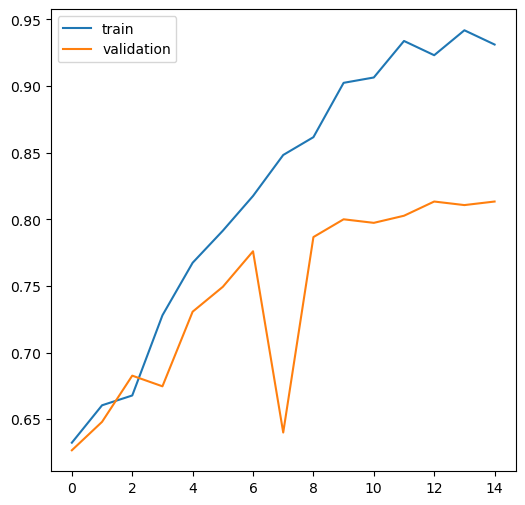

In [50]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history)

### 🚩 결과

#### 사전 모델을 변경한 결과 Vgg16보다 좋은 결과를 보임

#### 훈련결과
- acc: 0.9278
- loss: 0.2527
- val_acc: 0.8133
- val_loss: 0.5816

#### 테스트 결과
- acc: 0.8293
- loss: 0.4863

#### 일반화를 위하여 Albumentation의 수치를 높여 학습을 진행

### 6️⃣ Albumentation

In [52]:
import albumentations as A
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

train_file_paths = train_df['file_paths'].values
train_targets = pd.get_dummies(train_df['targets']).values

validation_file_paths = validation_df['file_paths'].values
validation_targets = pd.get_dummies(validation_df['targets']).values

test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

# 이미지 변환 (증강)
aug = A.Compose([
    # 크기 조정 및 회전
    A.ShiftScaleRotate(p=0.5),
    # 좌우 반전
    A.HorizontalFlip(p=0.5),
],p=0.5)


train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE,
                        aug=aug,
                        preprocess=resnet50_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input)

In [53]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model2 = create_model(model_name='resnet50', verbose=True)
model2.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)    │ (None, 244, 244, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 250, 250, 3)       │               0 │ input_layer_7[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 122, 122, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 124, 124, 64)      │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 61, 61, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 61, 61, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 61, 61, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 61, 61, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 61, 61, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 61, 61, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 63, 63, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 61, 61, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 61, 61, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 61, 61, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 23,667,760 (90.29 MB)

 Trainable params: 23,622,320 (90.11 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [54]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# weights 저장
mcp_cb = ModelCheckpoint(
    filepath="./callback_files/1cycle/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습률 동적으로 감소
rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습 조기 중단
ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=3,
    mode='min'
)

In [55]:
import gc

# 메모리 해제 함수
gc.collect()

6001

In [56]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 20

# 훈련
history2 = model2.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - acc: 0.2257 - loss: 2.2386 - val_acc: 0.1227 - val_loss: 20.8319 - learning_rate: 0.0010
Epoch 2/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - acc: 0.2529 - loss: 2.0354 - val_acc: 0.2773 - val_loss: 4.1926 - learning_rate: 0.0010
Epoch 3/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - acc: 0.3343 - loss: 1.7738 - val_acc: 0.1413 - val_loss: 58.9864 - learning_rate: 0.0010
Epoch 4/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - acc: 0.3603 - loss: 1.6686 - val_acc: 0.2933 - val_loss: 3.3704 - learning_rate: 0.0010
Epoch 5/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.4472 - loss: 1.5513 - val_acc: 0.2907 - val_loss: 3.4318 - learning_rate: 0.0010
Epoch 6/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - acc: 0.4435 - loss: 1.4791 - val_acc: 0.3947 - val_loss: 1.7210 - learning_rate: 0.0010
Epoch 7/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - acc: 0.4476 - loss: 1.4729 - val_acc: 0.3147 - val_loss: 2.0997 - learning_rate: 0.0010
Epoch 8/20


In [57]:
test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

test_dataset = Dataset(test_file_paths, 
                            test_targets, 
                            batch_size=BATCH_SIZE, 
                            preprocess=resnet50_preprocess_input)

model2.evaluate(test_dataset, batch_size=BATCH_SIZE)

30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 316ms/step - acc: 0.8267 - loss: 0.5898


[0.6108368635177612, 0.7927350401878357]

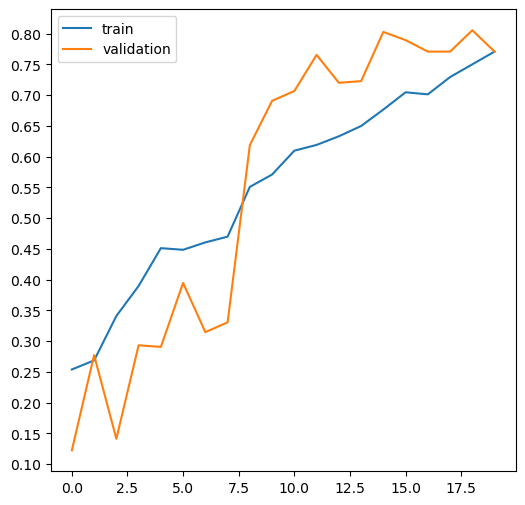

In [58]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history2)

### 🚩 결과

#### Albumentation의 p=0.5로 진행
#### 학습결과
- acc: 0.7552
- loss: 0.6803
- val_acc: 0.8053
- val_loss: 0.5313

#### 테스트 결과
- acc: 0.8267
- loss: 0.5898

#### 정확도가 줄어들어 확률을 낮추어 다시 적용

### 7️⃣ Albumentation2

In [59]:
import albumentations as A
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

train_file_paths = train_df['file_paths'].values
train_targets = pd.get_dummies(train_df['targets']).values

validation_file_paths = validation_df['file_paths'].values
validation_targets = pd.get_dummies(validation_df['targets']).values

test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

# 이미지 변환 (증강)
aug = A.Compose([
    # 크기 조정 및 회전
    A.ShiftScaleRotate(p=0.2),
    # 좌우 반전
    A.HorizontalFlip(p=0.2),
],p=0.2)


train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE,
                        aug=aug,
                        preprocess=resnet50_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet50_preprocess_input)

In [60]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model3 = create_model(model_name='resnet50', verbose=True)
model3.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)    │ (None, 244, 244, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 250, 250, 3)       │               0 │ input_layer_8[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 122, 122, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 124, 124, 64)      │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 61, 61, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 61, 61, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 61, 61, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 61, 61, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 61, 61, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 61, 61, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 63, 63, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 61, 61, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 61, 61, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 61, 61, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 23,667,760 (90.29 MB)

 Trainable params: 23,622,320 (90.11 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [61]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# weights 저장
mcp_cb = ModelCheckpoint(
    filepath="./callback_files/1cycle/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습률 동적으로 감소
rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습 조기 중단
ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=3,
    mode='min'
)

In [62]:
import gc

# 메모리 해제 함수
gc.collect()

5295

In [63]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 20

# 훈련
history3 = model3.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - acc: 0.2207 - loss: 2.2868 - val_acc: 0.0987 - val_loss: 51.0327 - learning_rate: 0.0010
Epoch 2/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - acc: 0.3124 - loss: 1.9483 - val_acc: 0.1013 - val_loss: 137.1477 - learning_rate: 0.0010
Epoch 3/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - acc: 0.3700 - loss: 1.7526 - val_acc: 0.2320 - val_loss: 2.0168 - learning_rate: 0.0010
Epoch 4/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - acc: 0.4110 - loss: 1.6190 - val_acc: 0.2000 - val_loss: 5.7520 - learning_rate: 0.0010
Epoch 5/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - acc: 0.4460 - loss: 1.5343 - val_acc: 0.2960 - val_loss: 4.8245 - learning_rate: 0.0010
Epoch 6/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - acc: 0.5418 - loss: 1.3017 - val_acc: 0.5947 - val_loss: 1.0817 - learning_rate: 1.0000e-04
Epoch 7/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - acc: 0.6084 - loss: 1.1098 - val_acc: 0.6560 - val_loss: 0.8684 - learning_rate: 1.0000e-04
Ep

In [64]:
test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values

test_dataset = Dataset(test_file_paths, 
                            test_targets, 
                            batch_size=BATCH_SIZE, 
                            preprocess=resnet50_preprocess_input)

model3.evaluate(test_dataset, batch_size=BATCH_SIZE)

30/30 ━━━━━━━━━━━━━━━━━━━━ 9s 314ms/step - acc: 0.8339 - loss: 0.4480


[0.49659180641174316, 0.8226495981216431]

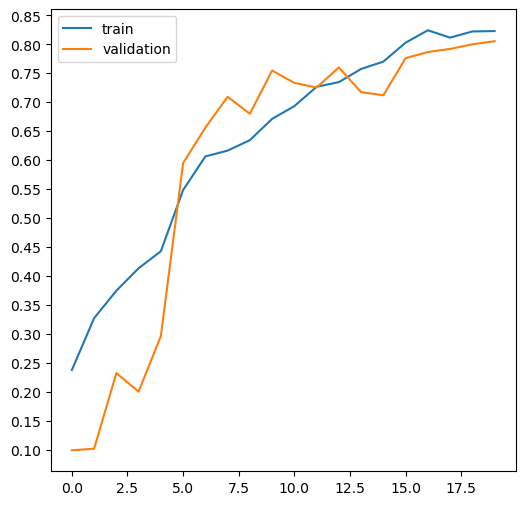

In [65]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history3)

### 🚩 결과

#### Albumentation의 p=0.2로 진행
#### 학습결과
- acc: 0.8301
- loss: 0.4613
- val_acc: 0.8000
- val_loss: 0.5288

#### 테스트 결과
- acc: 0.8339 
- loss: 0.4480

#### 성능이 0.83으로 적합하다고 판단, 성능 검증 진행

### 8️⃣ 성능검증

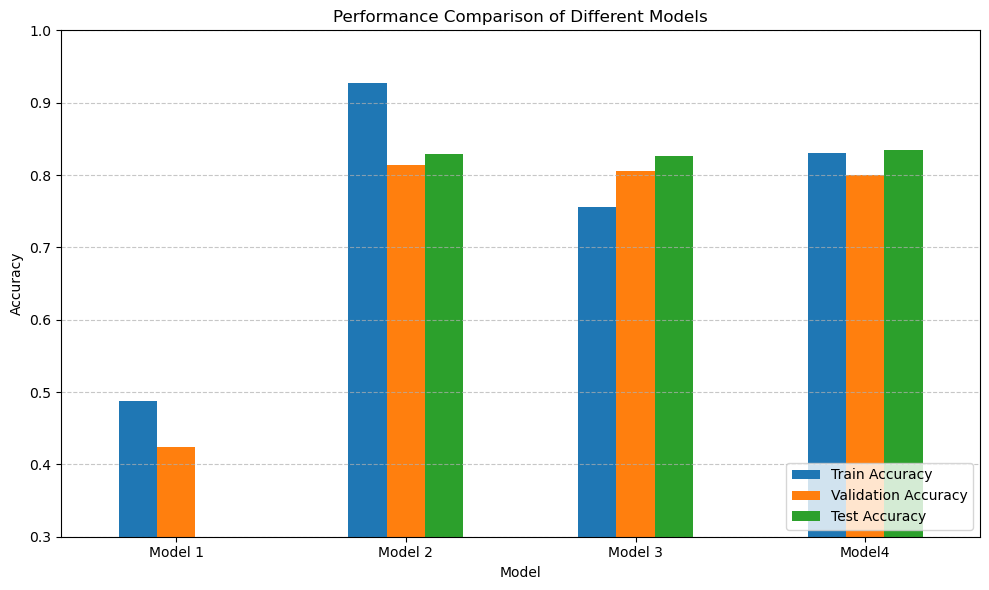

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터프레임 생성
data = {
    'Model': ['Model 1', 'Model 2', 'Model 3', 'Model4'],
    'Train Accuracy': [0.4872, 0.9278, 0.7552, 0.8301],
    'Validation Accuracy': [0.4240, 0.8133, 0.8053,0.8000],
    'Test Accuracy': [0.001 , 0.8293, 0.8267,0.8339]
}

df = pd.DataFrame(data)

# 그래프 그리기
df.plot(x='Model', kind='bar', figsize=(10, 6))
plt.title('Performance Comparison of Different Models')
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.ylim(0.3, 1.0)  # y 축 범위 설정
plt.xticks(rotation=0)  # x 축 눈금 라벨 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)  # 그리드 추가
plt.legend(loc='lower right')  # 범례 위치 설정
plt.tight_layout()  # 레이아웃 조정
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━

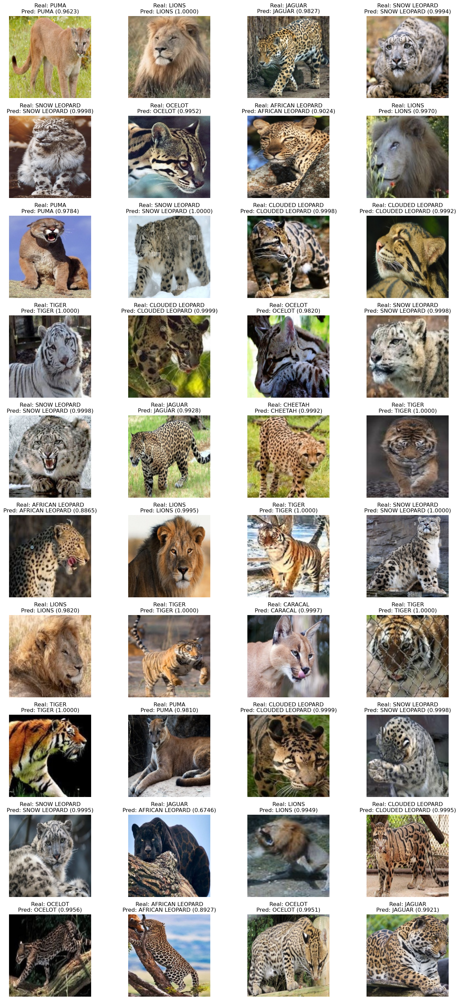

In [92]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input


# 클래스 이름 지정
class_names = ['AFRICAN LEOPARD', 'CARACAL', 'CHEETAH', 'CLOUDED LEOPARD', 'JAGUAR', 'LIONS', 'OCELOT', 'PUMA', 'SNOW LEOPARD', 'TIGER']


# 선택할 이미지의 시작 인덱스와 끝 인덱스 지정
start_index = 100
end_index = 140

# 행과 열의 개수 지정
num_rows = (end_index - start_index + 3) // 4  # +3 ensures rounding up
num_cols = 4

# 서브플롯 설정
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))

# 시작부터 끝 인덱스까지의 이미지들을 처리
for idx, i in enumerate(range(start_index, end_index)):
    # 이미지 파일 경로 선택
    selected_file_path = train_file_paths[i]

    # 이미지 로드 및 전처리
    image = cv2.cvtColor(cv2.imread(selected_file_path), cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (244, 244))
    processed_image = resnet50_preprocess_input(image.copy())

    # 모델 예측
    predicted_probabilities = model.predict(np.expand_dims(processed_image, axis=0))

    # 예측된 클래스 및 확률 출력
    predicted_class_index = np.argmax(predicted_probabilities)
    predicted_class_name = class_names[predicted_class_index]
    predicted_probability = predicted_probabilities[0][predicted_class_index]

    # 실제 클래스 정보 가져오기
    real_class_index = np.where(train_targets[i])[0][0]  # True 값의 인덱스 가져오기
    real_class_name = class_names[real_class_index]

    # 서브플롯에 이미지와 텍스트 출력
    ax = axs[idx // num_cols, idx % num_cols]
    ax.imshow(image)
    ax.set_title(f"Real: {real_class_name}\nPred: {predicted_class_name} ({predicted_probability:.4f})")
    ax.axis('off')

# 남은 서브플롯을 비활성화
for j in range(idx + 1, num_rows * num_cols):
    axs[j // num_cols, j % num_cols].axis('off')

plt.tight_layout()
plt.show()